In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, roc_auc_score

## Import Data

In [2]:
#Download Data from source, install openpyxl to read .xlsx file, save dataset to .csv
download_data = False
if download_data == True:
    !wget https://www.muratkoklu.com/datasets/vtdhnd05.php -O Pumpkin_Seeds_Dataset.zip
    !mkdir data
    !unzip Pumpkin_Seeds_Dataset.zip -d data
    !rm Pumpkin_Seeds_Dataset.zip
    !pip install openpyxl
    df = pd.read_excel('data/Pumpkin_Seeds_Dataset/Pumpkin_Seeds_Dataset.xlsx')
    df.to_csv('data/Pumpkin_Seeds_Dataset/Pumpkin_Seeds_Dataset.csv', index=False)

df = pd.read_csv('data/Pumpkin_Seeds_Dataset/Pumpkin_Seeds_Dataset.csv')

In [3]:
df.head()

,Area,Perimeter,Major_Axis_Length,Minor_Axis_Length,Convex_Area,Equiv_Diameter,Eccentricity,Solidity,Extent,Roundness,Aspect_Ration,Compactness,Class
0,56276,888.242,326.1485,220.2388,56831,267.6805,0.7376,0.9902,0.7453,0.8963,1.4809,0.8207,Çerçevelik
1,76631,1068.146,417.1932,234.2289,77280,312.3614,0.8275,0.9916,0.7151,0.8440,1.7811,0.7487,Çerçevelik
2,71623,1082.987,435.8328,211.0457,72663,301.9822,0.8749,0.9857,0.7400,0.7674,2.0651,0.6929,Çerçevelik
3,66458,992.051,381.5638,222.5322,67118,290.8899,0.8123,0.9902,0.7396,0.8486,1.7146,0.7624,Çerçevelik
4,66107,998.146,383.8883,220.4545,67117,290.1207,0.8187,0.9850,0.6752,0.8338,1.7413,0.7557,Çerçevelik


In [4]:
df.dtypes

Area                   int64
Perimeter            float64
Major_Axis_Length    float64
Minor_Axis_Length    float64
Convex_Area            int64
Equiv_Diameter       float64
Eccentricity         float64
Solidity             float64
Extent               float64
Roundness            float64
Aspect_Ration        float64
Compactness          float64
Class                 object
dtype: object

In [5]:
df.isnull().sum()

Area                 0
Perimeter            0
Major_Axis_Length    0
Minor_Axis_Length    0
Convex_Area          0
Equiv_Diameter       0
Eccentricity         0
Solidity             0
Extent               0
Roundness            0
Aspect_Ration        0
Compactness          0
Class                0
dtype: int64

In [7]:
df['Class'].value_counts()

Çerçevelik       1300
Ürgüp Sivrisi    1200
Name: Class, dtype: int64

## Class Mapping

In [8]:
df['Class'].unique().tolist()

['Çerçevelik', 'Ürgüp Sivrisi']

In [9]:
#Sets all column names to lowercase with underscore separators, maps target 'class' to binary values

# rename columns for ease of use
df.columns = df.columns.str.lower().str.replace(' ', '_')

# class map seed names
class_mapping = {'Çerçevelik': 0, 'Ürgüp Sivrisi': 1}
df['class'] = df['class'].map(class_mapping)

In [10]:
features = ['area',
            'perimeter',
            'major_axis_length',
            'minor_axis_length',
            'convex_area',
            'equiv_diameter',
            'eccentricity',
            'solidity',
            'extent',
            'roundness',
            'aspect_ration',
            'compactness']

### Data Preparation

In [11]:
random_state = 42

# Split data into training and testing sets
df_train, df_test = train_test_split(df, test_size=0.2, random_state=random_state)

# Separate target variable from feature data
X_train = df_train.drop(columns=['class'])
X_test = df_test.drop(columns=['class'])
y_train = df_train['class']
y_test = df_test['class']

# Scale feature data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [12]:
len(df_train), len(df_test)

(2000, 500)

## Feature Engineering

In [428]:
df_FE = df.copy()

In [190]:
df_FE['extent_ecc'] = df_FE.extent/df_FE.eccentricity

In [191]:
df_FE['solid_ecc'] = df_FE.solidity/df_FE.eccentricity

In [318]:
df_FE['comp_eqd'] = df_FE.compactness/df_FE.equiv_diameter

In [432]:
# df_FE_features = df_FE.drop(columns=['class', 'solidity'])
# features = list(df_FE_features.columns)

In [434]:
df_FE = df_FE.drop(columns=['solidity'])

In [433]:
features

['area',
 'perimeter',
 'major_axis_length',
 'minor_axis_length',
 'convex_area',
 'equiv_diameter',
 'eccentricity',
 'extent',
 'roundness',
 'aspect_ration',
 'compactness']

## EDA

In [13]:
for feature in features:
    print(feature)
    print("Unique:", df[df['class'] == 0][feature].nunique())
    print("Min:", df[df['class'] == 0][feature].min())
    print("Max:", df[df['class'] == 0][feature].max())
    print("Mean:", df[df['class'] == 0][feature].mean().round(4))
    print("Median:", df[df['class'] == 0][feature].median())
    print()

area
Unique: 1272
Min: 55811
Max: 107476
Mean: 78423.1546
Median: 76718.5

perimeter
Unique: 1296
Min: 888.242
Max: 1416.303
Mean: 1089.5225
Median: 1083.1895

major_axis_length
Unique: 1300
Min: 320.8446
Max: 614.8959
Mean: 426.2726
Median: 425.42655

minor_axis_length
Unique: 1298
Min: 185.844
Max: 305.818
Mean: 234.7769
Median: 232.09359999999998

convex_area
Unique: 1283
Min: 56394
Max: 108536
Mean: 79286.4885
Median: 77525.5

equiv_diameter
Unique: 1272
Min: 266.5723
Max: 369.9226
Mean: 315.1933
Median: 312.53965000000005

eccentricity
Unique: 816
Min: 0.4921
Max: 0.936
Mean: 0.8305
Median: 0.8354

solidity
Unique: 148
Min: 0.9542
Max: 0.9939
Mean: 0.9891
Median: 0.9898

extent
Unique: 819
Min: 0.5071
Max: 0.7814
Mean: 0.707
Median: 0.71815

roundness
Unique: 840
Min: 0.6153
Max: 0.9396
Mean: 0.8275
Median: 0.8299

aspect_ration
Unique: 1171
Min: 1.1487
Max: 2.841
Mean: 1.8226
Median: 1.8192499999999998

compactness
Unique: 804
Min: 0.5884
Max: 0.9049
Mean: 0.7412
Median: 0.739549

In [14]:
for feature in features:
    print(feature)
    print("Unique:", df[df['class'] == 1][feature].nunique())
    print("Min:", df[df['class'] == 1][feature].min())
    print("Max:", df[df['class'] == 1][feature].max())
    print("Mean:", df[df['class'] == 1][feature].mean().round(4))
    print()

area
Unique: 1189
Min: 47939
Max: 136574
Mean: 83079.5425

perimeter
Unique: 1200
Min: 868.485
Max: 1559.45
Mean: 1174.4319

major_axis_length
Unique: 1199
Min: 324.0113
Max: 661.9113
Mean: 489.4585

minor_axis_length
Unique: 1200
Min: 152.1718
Max: 297.7952
Mean: 216.0644

convex_area
Unique: 1185
Min: 48366
Max: 138384
Mean: 83914.8133

equiv_diameter
Unique: 1189
Min: 247.0584
Max: 417.0029
Mean: 323.8202

eccentricity
Unique: 670
Min: 0.7507
Max: 0.9481
Mean: 0.8937

solidity
Unique: 127
Min: 0.9186
Max: 0.9944
Mean: 0.9899

extent
Unique: 937
Min: 0.468
Max: 0.8296
Mean: 0.6782

roundness
Unique: 869
Min: 0.5546
Max: 0.8967
Mean: 0.7526

aspect_ration
Unique: 1125
Min: 1.5138
Max: 3.1444
Mean: 2.2791

compactness
Unique: 789
Min: 0.5608
Max: 0.8102
Mean: 0.664



<AxesSubplot:>

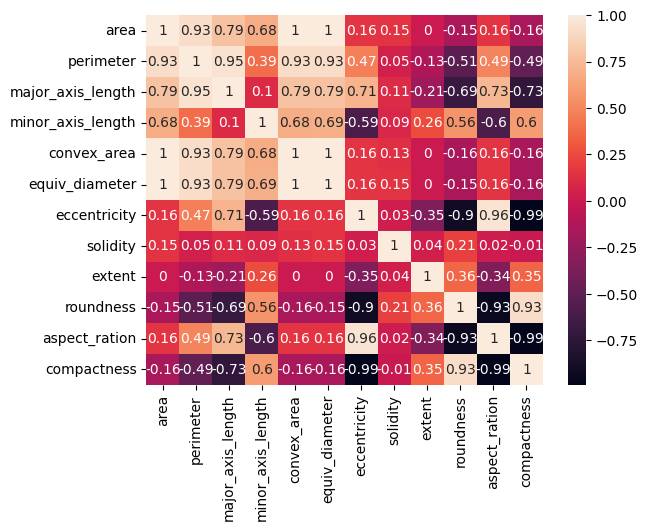

In [15]:
correlation_matrix = df_train.drop(columns='class').corr().round(2)
sns.heatmap(data=correlation_matrix, annot=True)

## Autoviz EDA

AutoViz generates a variety of plots for easy visualization of data trends and relationships.

In [36]:
!pip install autoviz

Imported v0.1.735. After importing autoviz, you must run '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (2500, 13)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  10
    Number of Integer-Categorical Columns =  2
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String C

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
area,int64,0.000000,96,47939.000000,136574.000000,"Column has 18 outliers greater than upper bound (118246.25) or lower than lower bound(42276.25). Cap them or remove them., Column has a high correlation with ['perimeter', 'equiv_diameter']. Consider dropping one of them."
perimeter,float64,0.000000,NA,868.485000,1559.450000,Column has 16 outliers greater than upper bound (1435.11) or lower than lower bound(817.06). Cap them or remove them.
major_axis_length,float64,0.000000,NA,320.844600,661.911300,"Column has 21 outliers greater than upper bound (609.41) or lower than lower bound(298.29). Cap them or remove them., Column has a high correlation with ['perimeter']. Consider dropping one of them."
minor_axis_length,float64,0.000000,NA,152.171800,305.818000,Column has 30 outliers greater than upper bound (284.81) or lower than lower bound(167.11). Cap them or remove them.
convex_area,int64,0.000000,97,48366.000000,138384.000000,"Column has 17 outliers greater than upper bound (119726.38) or lower than lower bound(42583.38). Cap them or remove them., Column has a high correlation with ['perimeter', 'equiv_diameter', 'area']. Consider dropping one of them."
equiv_diameter,float64,0.000000,NA,247.058400,417.002900,"Column has 13 outliers greater than upper bound (394.89) or lower than lower bound(243.33). Cap them or remove them., Column has a high correlation with ['perimeter']. Consider dropping one of them."
eccentricity,float64,0.000000,NA,0.492100,0.948100,Column has 18 outliers greater than upper bound (1.00) or lower than lower bound(0.73). Cap them or remove them.
solidity,float64,0.000000,NA,0.918600,0.994400,Column has 103 outliers greater than upper bound (1.00) or lower than lower bound(0.98). Cap them or remove them.
extent,float64,0.000000,NA,0.468000,0.829600,Column has 46 outliers greater than upper bound (0.86) or lower than lower bound(0.54). Cap them or remove them.
roundness,float64,0.000000,NA,0.554600,0.939600,"Column has 5 outliers greater than upper bound (0.96) or lower than lower bound(0.63). Cap them or remove them., Column has a high correlation with ['eccentricity']. Consider dropping one of them."


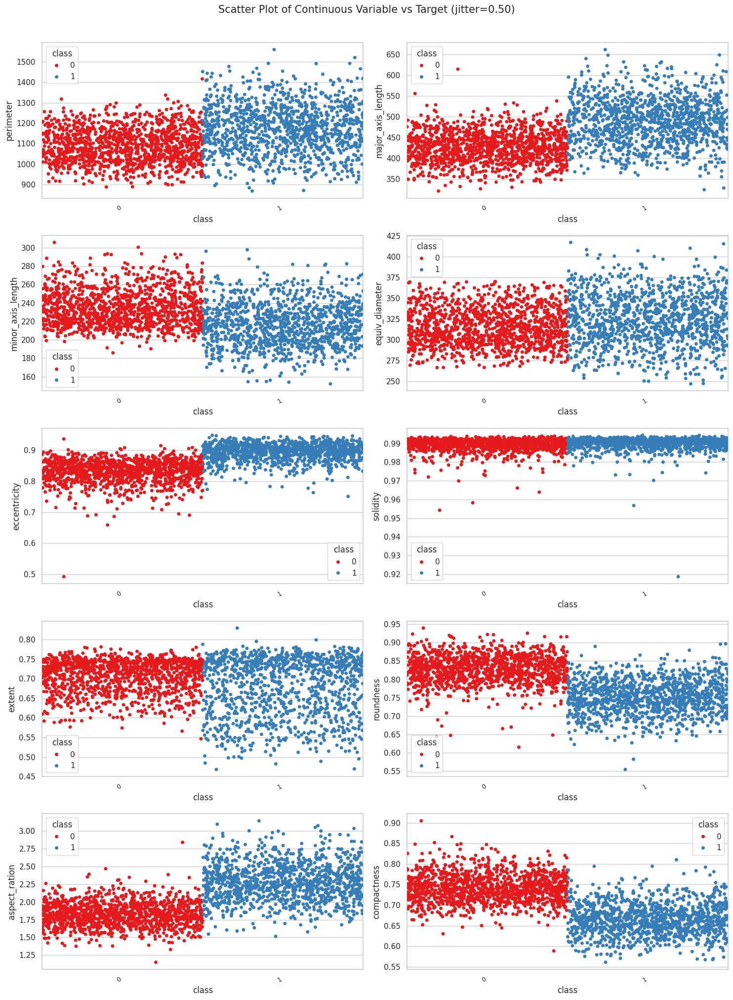

Total Number of Scatter Plots = 55


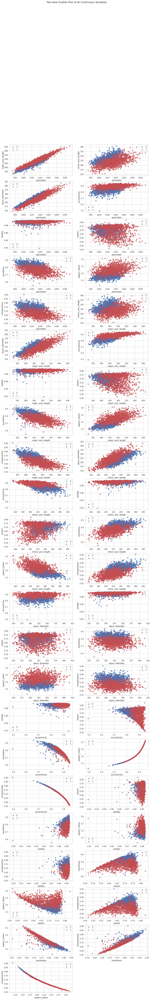

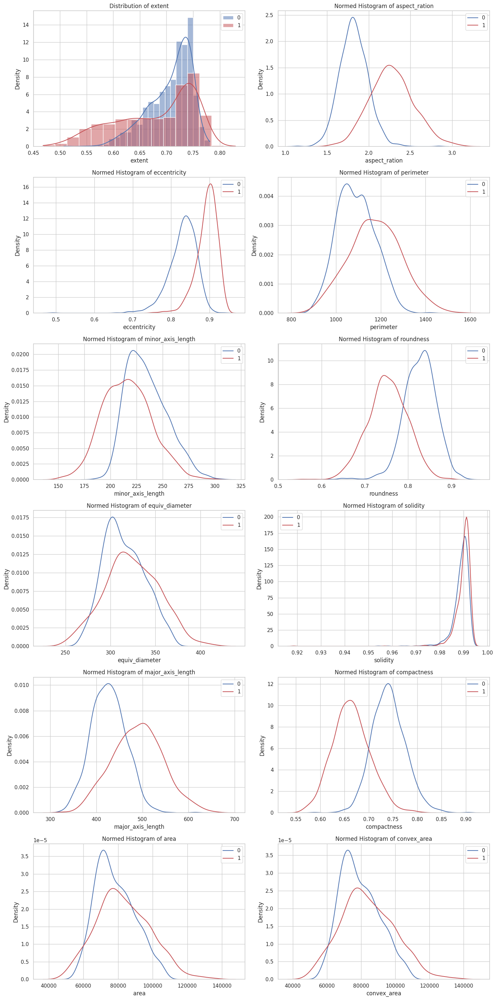

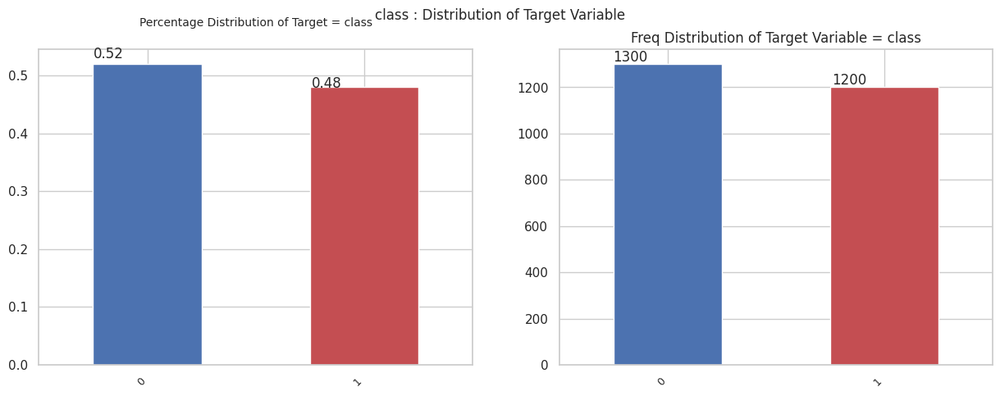

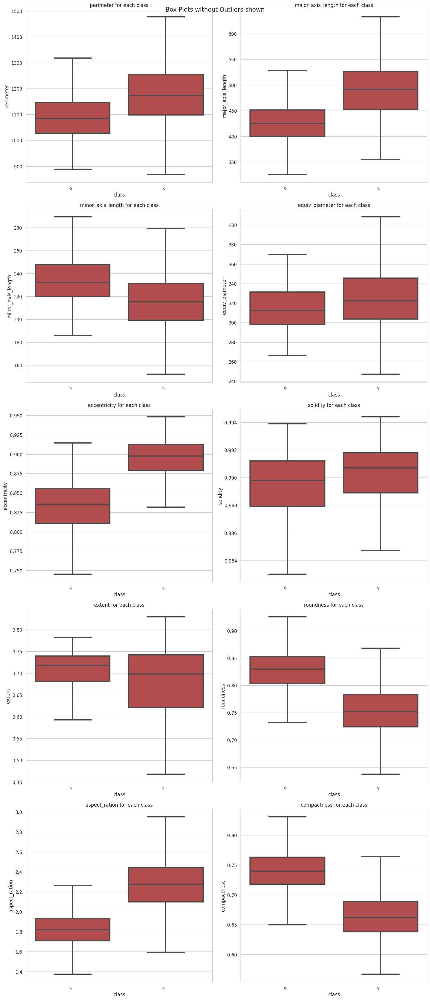

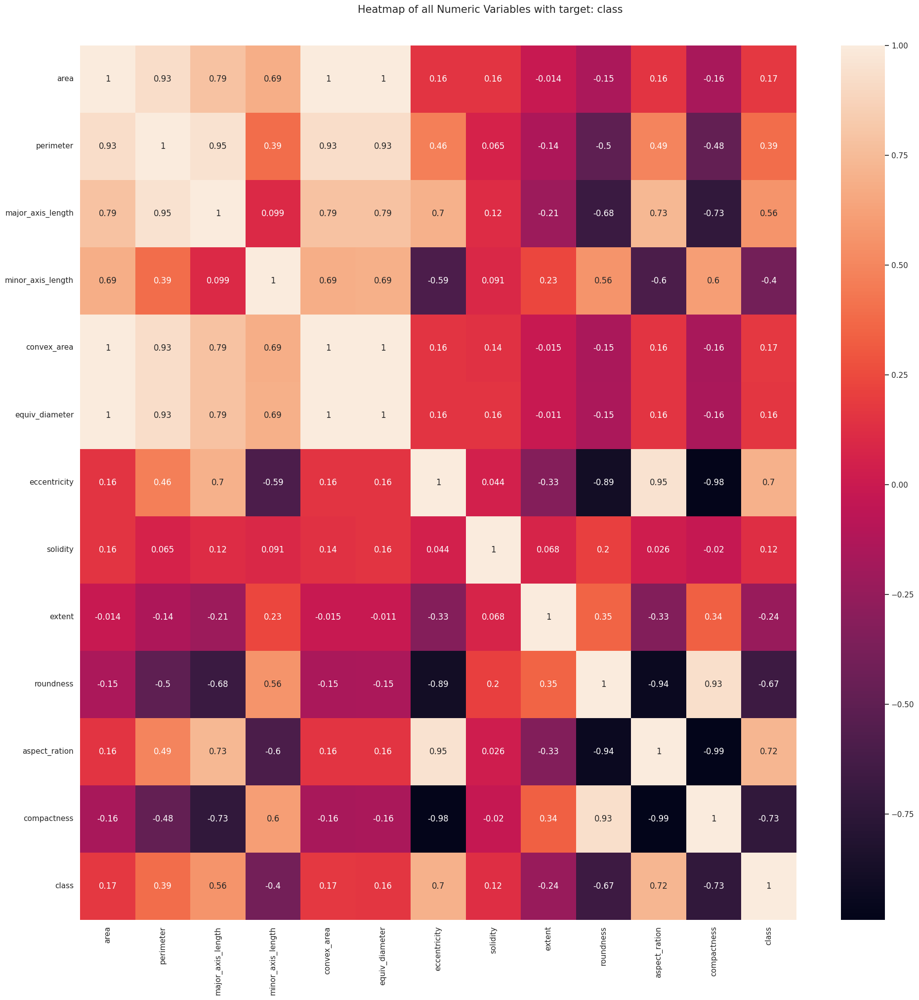

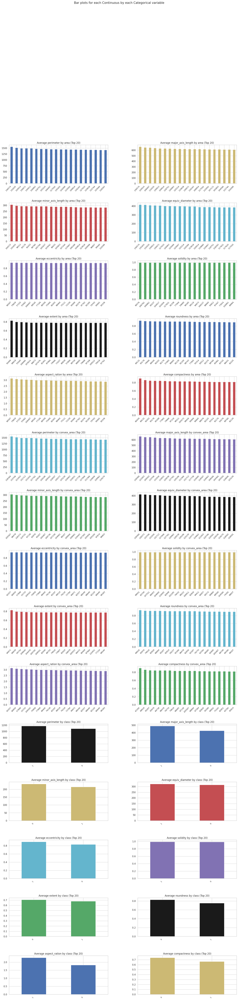

All Plots done
Time to run AutoViz = 24 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,area,perimeter,major_axis_length,minor_axis_length,convex_area,equiv_diameter,eccentricity,solidity,extent,roundness,aspect_ration,compactness,class
53,82468,1134.996,452.2654,232.5943,83212,324.0394,0.8576,0.9911,0.6277,0.8045,1.9444,0.7165,0
2391,72269,1098.634,462.7871,199.3336,72971,303.3410,0.9025,0.9904,0.7188,0.7524,2.3217,0.6555,1
2310,72243,1081.761,439.2749,210.4540,72987,303.2864,0.8778,0.9898,0.7484,0.7758,2.0873,0.6904,1
728,74986,1077.192,428.8910,223.4677,75741,308.9905,0.8535,0.9900,0.7118,0.8121,1.9193,0.7204,0
850,70110,1046.245,418.6039,214.3956,70756,298.7755,0.8589,0.9909,0.6650,0.8049,1.9525,0.7137,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1033,85054,1180.494,488.0854,222.6245,85821,329.0807,0.8899,0.9911,0.5741,0.7670,2.1924,0.6742,0
1731,84112,1149.419,472.5015,227.4735,84770,327.2533,0.8765,0.9922,0.6930,0.8000,2.0772,0.6926,1
763,88283,1147.212,454.1398,248.5042,88978,335.2692,0.8370,0.9922,0.6691,0.8429,1.8275,0.7383,0
835,71711,1066.107,434.2415,211.0720,72631,302.1676,0.8739,0.9873,0.7580,0.7929,2.0573,0.6959,0


In [52]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
target_variable = 'class'

AV = AutoViz_Class()
AV.AutoViz(filename='',
           dfte=df,
           depVar=target_variable,
           verbose=1,
           max_rows_analyzed=df.shape[0],
           max_cols_analyzed=df.shape[1])

In [183]:
from autoviz import FixDQ

In [195]:
fixdq = FixDQ(quantile=0.9)

In [272]:
df_fdq = fixdq.fit_transform(df)

    Dropping perimeter which has a high correlation with ['area']
    Dropping major_axis_length which has a high correlation with ['perimeter']
    Dropping convex_area which has a high correlation with ['area', 'perimeter']
    Dropping equiv_diameter which has a high correlation with ['area', 'perimeter', 'convex_area']
    Dropping aspect_ration which has a high correlation with ['eccentricity', 'roundness']
    Dropping compactness which has a high correlation with ['eccentricity', 'roundness', 'aspect_ration']
Dropped 6 columns total in dataset


Analysis of graphs:

Scatter Plots: Features of note: Compactness, Aspect_Ration, Roundness, Eccentricity

### Train Data EDA

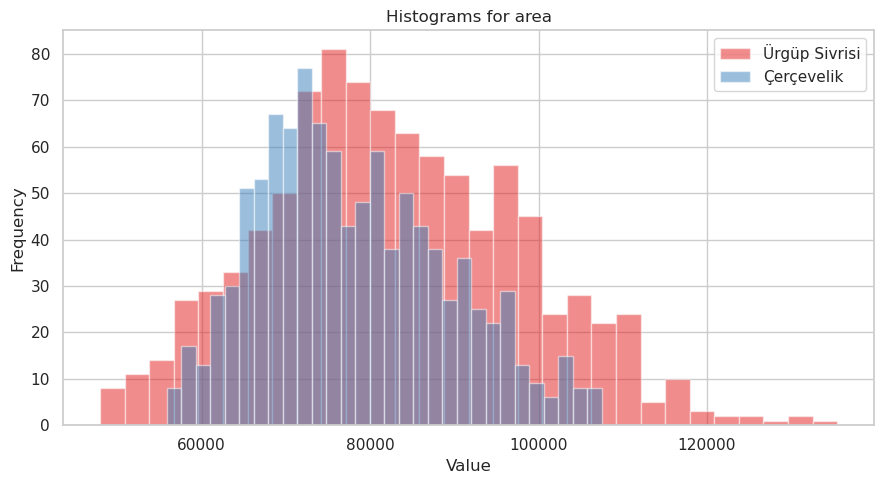

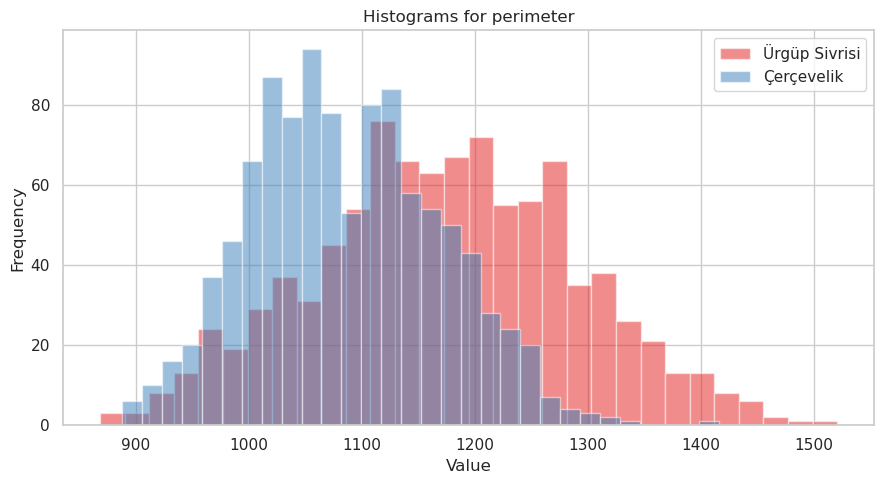

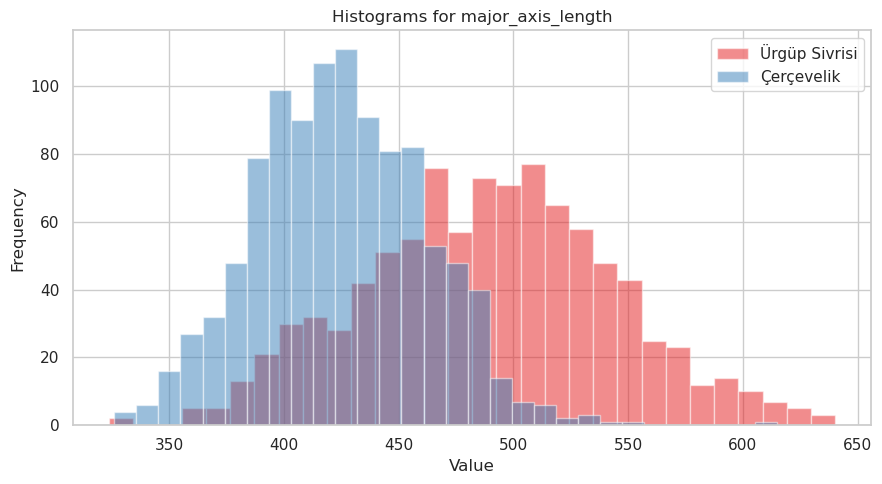

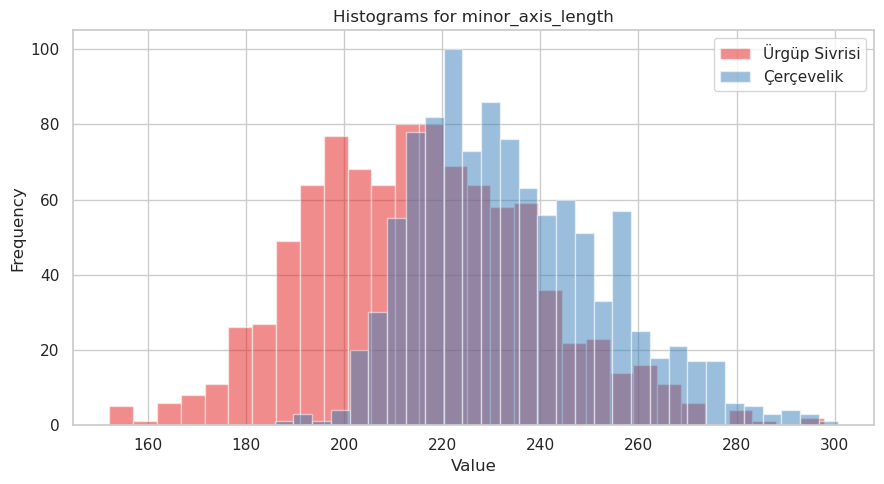

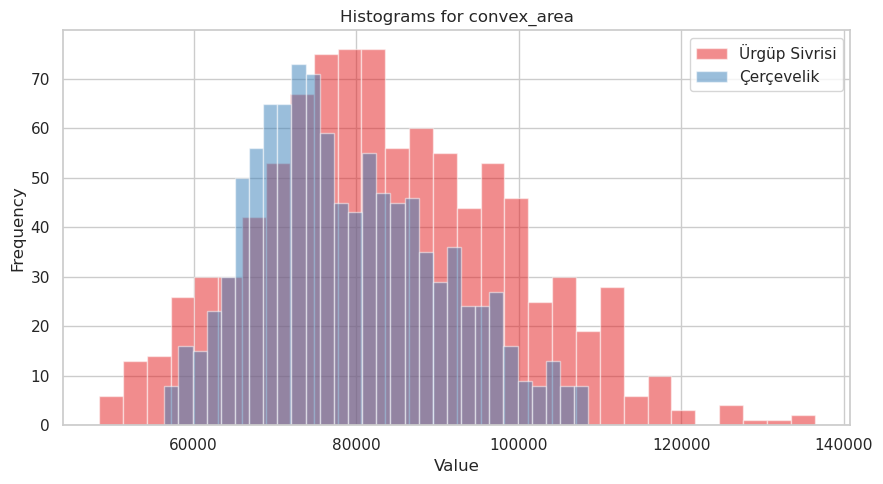

...

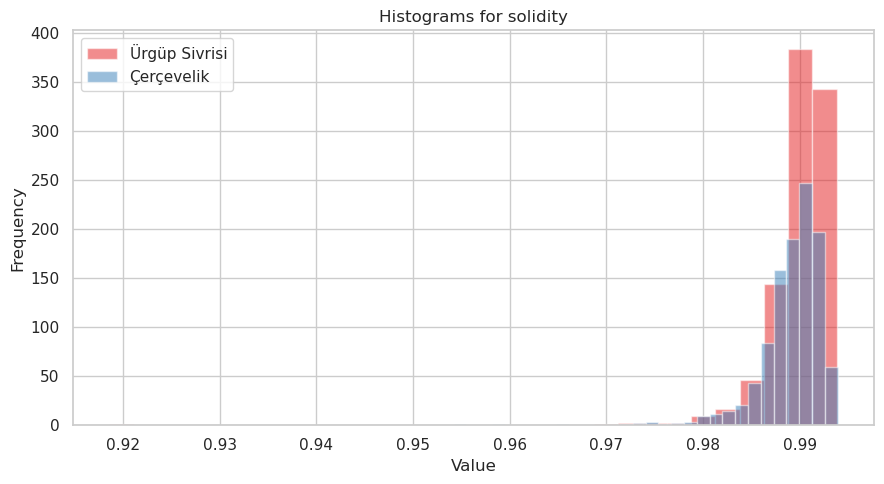

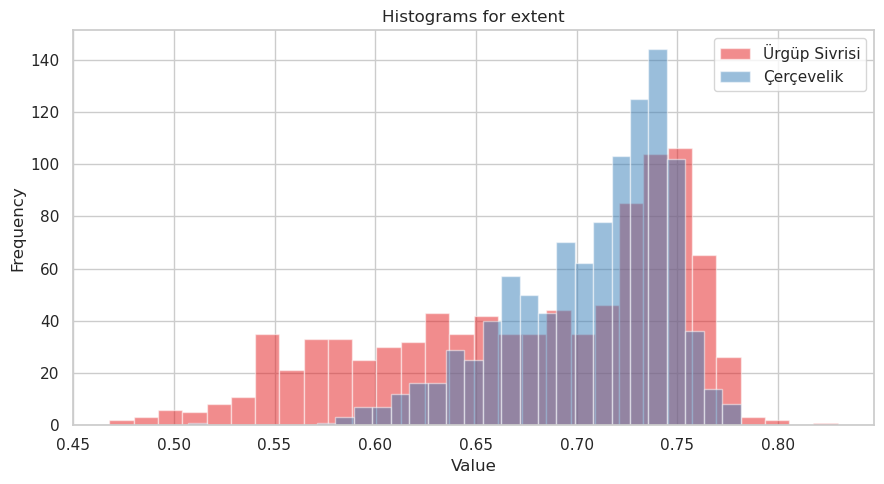

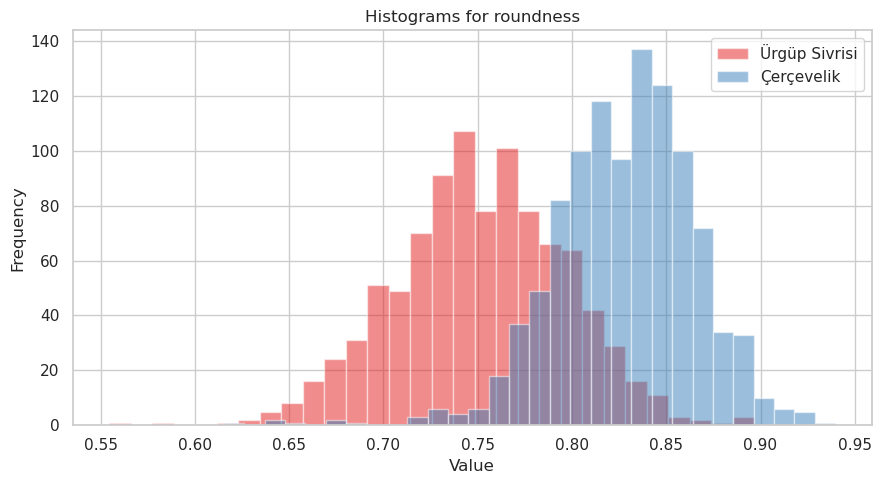

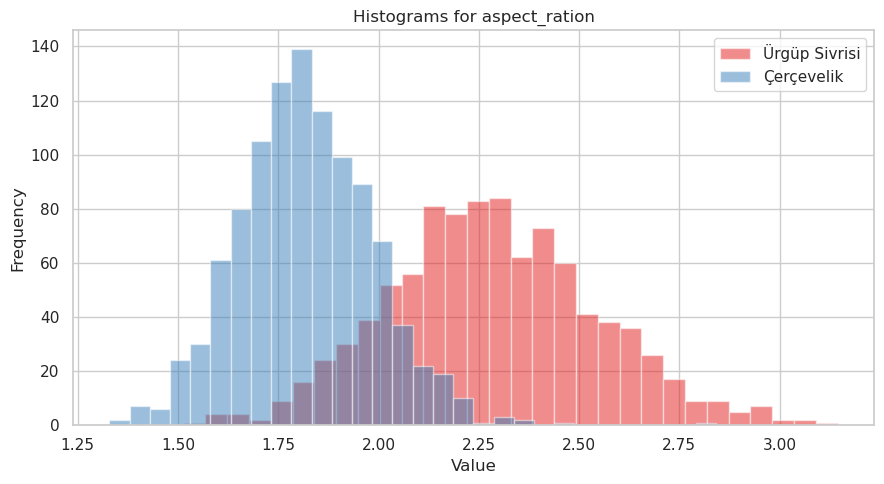

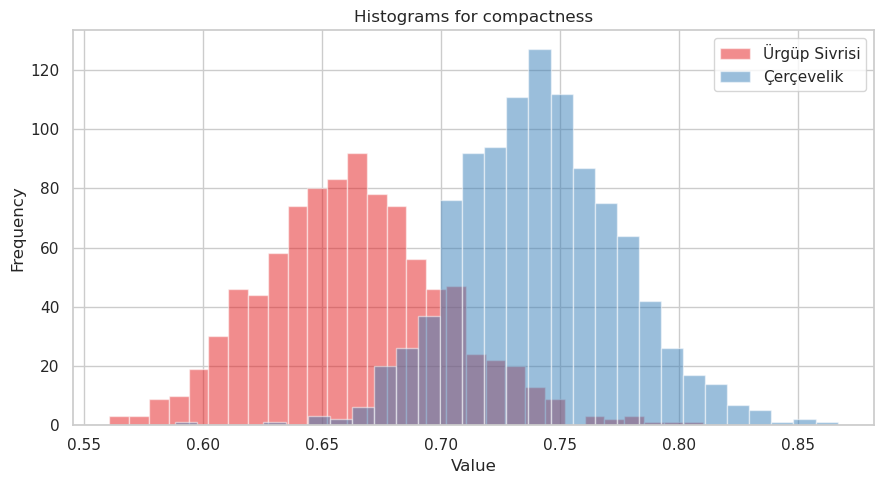

In [39]:
for feature in features:
    fig, ax = plt.subplots(figsize=(9, 5))

    df_train[df_train['class'] == 1][feature].hist(bins=30, alpha=0.5, label='Ürgüp Sivrisi')
    df_train[df_train['class'] == 0][feature].hist(bins=30, alpha=0.5, label='Çerçevelik')

    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Histograms for {feature}')
    plt.legend()
    plt.tight_layout()
    plt.show()
    print()

## Feature Selection

## Model Evaluation Functions

### StratifiedKFold

In [16]:
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

### Accuracy Score for binary evaluation, seaborn confusion matrix

In [17]:
def model_evaluation(classifier):
    cm = confusion_matrix(y_test, classifier.predict(X_test))
    counts = [value for value in cm.flatten()]
    labels = [f'{v1}' for v1 in counts]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm, annot = labels, cmap = 'Greens', fmt = '')
    y_pred = classifier.predict(X_test)
    y_train_pred = classifier.predict(X_train)
    print('The Training Accuracy of the algorithm is ', accuracy_score(y_train, y_train_pred))
    print('The Testing Accuracy of the algorithm is ', accuracy_score(y_test, y_pred))
    return [(accuracy_score(y_train * 100, y_train_pred * 100) * 100), (accuracy_score(y_test * 100, y_pred * 100) * 100)]

### Model Feature Importance Labeler

In [18]:
def feature_importance_labels(model):
    df_feature_importance = pd.DataFrame({'Feature': features, 'Importance': model.feature_importances_})
    df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
    return pd.DataFrame(df_feature_importance)

# Models

## Logistic Regression

In [19]:
model_LR = LogisticRegression()
model_LR.fit(X_train, y_train)

LogisticRegression()

In [20]:
# KFold validation
score = cross_val_score(model_LR, X_train, y_train, cv=skf, scoring='accuracy')
print(f'Scores for each fold are: {score}')
print(f'Average score: {"{:.3f}".format(score.mean())}')

Scores for each fold are: [0.905 0.88  0.87  0.885 0.88  0.885 0.875 0.865 0.895 0.895]
Average score: 0.883


In [21]:
pred_LR = model_LR.predict(X_test)
print(classification_report(y_test, pred_LR))

              precision    recall  f1-score   support

           0       0.83      0.89      0.86       251
           1       0.88      0.82      0.85       249

    accuracy                           0.86       500
   macro avg       0.86      0.86      0.86       500
weighted avg       0.86      0.86      0.86       500



The Training Accuracy of the algorithm is  0.8855
The Testing Accuracy of the algorithm is  0.856


[88.55, 85.6]

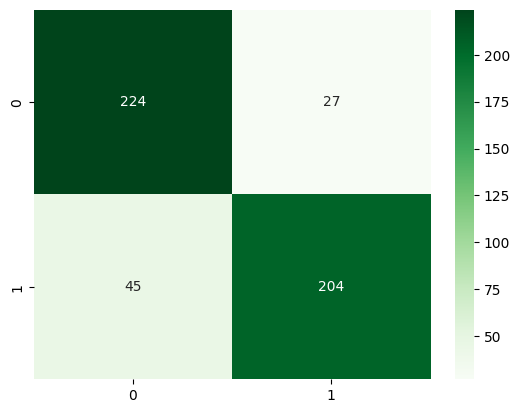

In [22]:
model_evaluation(model_LR)

## Decision Tree Classifier Model

In [23]:
# Test various max_depth to determine optimal model depth
for max_depth in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
    model_DTC=DecisionTreeClassifier(max_depth=max_depth)
    model_DTC.fit(X_train, y_train)

    print("max_depth: ", max_depth)
    print("Score the X-train with Y-train is : ", model_DTC.score(X_train, y_train))
    print("Score the X-test  with Y-test  is : ", model_DTC.score(X_test, y_test))

max_depth:  1
Score the X-train with Y-train is :  0.8745
Score the X-test  with Y-test  is :  0.836
max_depth:  2
Score the X-train with Y-train is :  0.8865
Score the X-test  with Y-test  is :  0.838
max_depth:  3
Score the X-train with Y-train is :  0.889
Score the X-test  with Y-test  is :  0.846
max_depth:  4
Score the X-train with Y-train is :  0.9025
Score the X-test  with Y-test  is :  0.86
max_depth:  5
Score the X-train with Y-train is :  0.9055
Score the X-test  with Y-test  is :  0.848
max_depth:  6
Score the X-train with Y-train is :  0.9225
Score the X-test  with Y-test  is :  0.85
max_depth:  7
Score the X-train with Y-train is :  0.932
Score the X-test  with Y-test  is :  0.836
max_depth:  8
Score the X-train with Y-train is :  0.9465
Score the X-test  with Y-test  is :  0.832
max_depth:  9
Score the X-train with Y-train is :  0.9575
Score the X-test  with Y-test  is :  0.83
max_depth:  10
Score the X-train with Y-train is :  0.9705
Score the X-test  with Y-test  is :  

In [24]:
model_DTC = DecisionTreeClassifier(max_depth=4)
model_DTC.fit(X_train, y_train)
print("Score the X-train with y-train is : ", model_DTC.score(X_train, y_train))
print("Score the X-test  with y-test  is : ", model_DTC.score(X_test, y_test))

Score the X-train with y-train is :  0.9025
Score the X-test  with y-test  is :  0.86


In [25]:
feature_importance_labels(model_DTC)

,Feature,Importance
11,compactness,0.876503
2,major_axis_length,0.052733
7,solidity,0.041040
1,perimeter,0.016595
3,minor_axis_length,0.007192
4,convex_area,0.005246
9,roundness,0.000691
0,area,0.000000
5,equiv_diameter,0.000000
6,eccentricity,0.000000


In [26]:
# KFold validation
score = cross_val_score(model_DTC, X_train, y_train, cv=skf, scoring='accuracy')
print(f'Scores for each fold are: {score}')
print(f'Average score: {"{:.3f}".format(score.mean())}')

Scores for each fold are: [0.89  0.88  0.86  0.885 0.895 0.875 0.86  0.88  0.865 0.91 ]
Average score: 0.880


The Training Accuracy of the algorithm is  0.9025
The Testing Accuracy of the algorithm is  0.86


[90.25, 86.0]

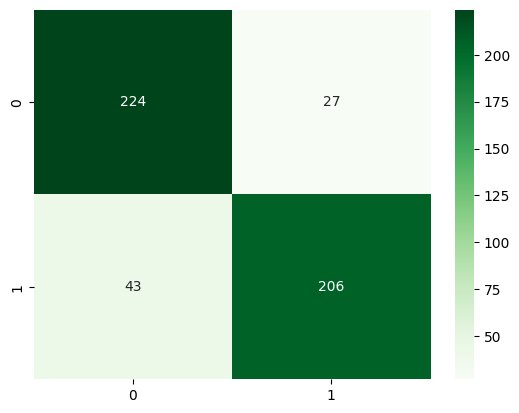

In [27]:
model_evaluation(model_DTC)

## Nearest Neighbors Model

In [28]:
parameters = {'n_neighbors': [2, 3, 4, 5], 'weights': ['uniform', 'distance']}
model_KNN = KNeighborsClassifier(n_neighbors = 4, n_jobs=-1)
clf_KNN = GridSearchCV(model_KNN, parameters, n_jobs=-1, cv=skf)
clf_KNN.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=KNeighborsClassifier(n_jobs=-1, n_neighbors=4),
             n_jobs=-1,
             param_grid={'n_neighbors': [2, 3, 4, 5],
                         'weights': ['uniform', 'distance']})

In [29]:
print(f'Best Score: {clf_KNN.best_score_}')
print(f'Best Hyperparameters: {clf_KNN.best_params_}')

Best Score: 0.881
Best Hyperparameters: {'n_neighbors': 5, 'weights': 'uniform'}


In [30]:
model_KNN = KNeighborsClassifier(n_neighbors = 5, weights='uniform')
model_KNN.fit(X_train, y_train)

print("Score the X-train with Y-train is : ", model_KNN.score(X_train, y_train))
print("Score the X-test  with Y-test  is : ", model_KNN.score(X_test, y_test))

Score the X-train with Y-train is :  0.9085
Score the X-test  with Y-test  is :  0.854


In [31]:
# KFold validation
score = cross_val_score(model_KNN, X_train, y_train, cv=skf, scoring='accuracy')
print(f'Scores for each fold are: {score}')
print(f'Average score: {"{:.3f}".format(score.mean())}')

Scores for each fold are: [0.905 0.885 0.885 0.885 0.885 0.88  0.865 0.855 0.875 0.89 ]
Average score: 0.881


In [32]:
y_pred = model_KNN.predict(X_test)
print(" Model Evaluation K Neighbors Classifier : accuracy score " , accuracy_score(y_test, y_pred))
print()
print(classification_report(y_test, y_pred))

 Model Evaluation K Neighbors Classifier : accuracy score  0.854

              precision    recall  f1-score   support

           0       0.84      0.88      0.86       251
           1       0.87      0.83      0.85       249

    accuracy                           0.85       500
   macro avg       0.86      0.85      0.85       500
weighted avg       0.85      0.85      0.85       500



The Training Accuracy of the algorithm is  0.9085
The Testing Accuracy of the algorithm is  0.854


[90.85, 85.39999999999999]

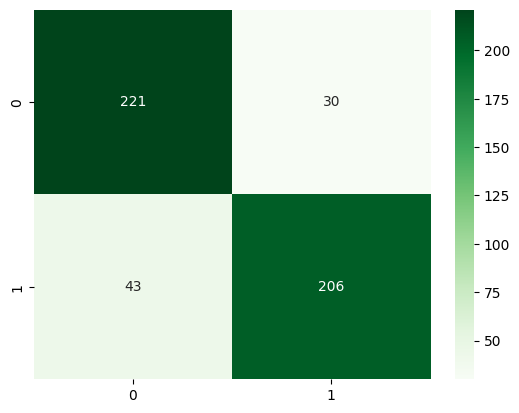

In [33]:
model_evaluation(model_KNN)

## Random Forest Classifier

In [34]:
parameters = {'n_estimators': [10, 50, 75, 100], 'max_features': [2, 4, 5, 6, 8], 'criterion': ['gini', 'log_loss']}
model_RFC = RandomForestClassifier()
clf_RFC = GridSearchCV(model_RFC, parameters, n_jobs=-1, cv=skf)
clf_RFC.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'log_loss'],
                         'max_features': [2, 4, 5, 6, 8],
                         'n_estimators': [10, 50, 75, 100]})

In [35]:
print(f'Best Score: {clf_RFC.best_score_}')
print(f'Best Hyperparameters: {clf_RFC.best_params_}')

Best Score: 0.8925000000000001
Best Hyperparameters: {'criterion': 'gini', 'max_features': 6, 'n_estimators': 100}


In [38]:
model_RFC = RandomForestClassifier(max_features=6, n_estimators=100, criterion='gini', n_jobs=-1)
model_RFC.fit(X_train, y_train)

score = cross_val_score(model_RFC, X_train, y_train, cv=skf, scoring='accuracy')
print(f'Scores for each fold are: {score}')
print(f'Average score: {"{:.3f}".format(score.mean())}')

Scores for each fold are: [0.89  0.895 0.895 0.885 0.895 0.885 0.885 0.89  0.875 0.905]
Average score: 0.890


The Training Accuracy of the algorithm is  1.0
The Testing Accuracy of the algorithm is  0.864


[100.0, 86.4]

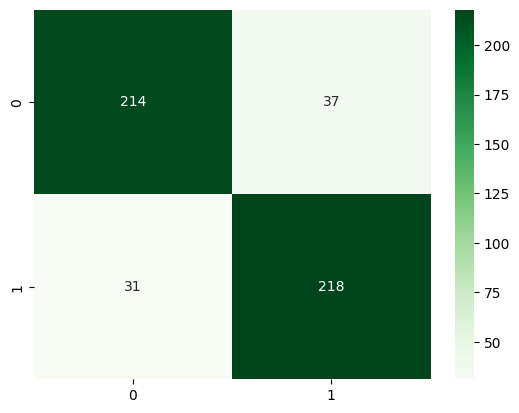

In [39]:
model_evaluation(model_RFC)

In [ ]:
# Random Forest Classifier tends to overtrain

## SVC Model

In [40]:
parameters = {'C': [1, 10, 100, 1000, 10000], }

model_svc = SVC(C=10)
clf_svc = GridSearchCV(model_svc, parameters, n_jobs=-1, cv=skf)
clf_svc.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=SVC(C=10), n_jobs=-1,
             param_grid={'C': [1, 10, 100, 1000, 10000]})

In [41]:
parameters = {'C': [1, 10, 100, 1000], 'kernel': ['rbf', 'poly'], 'degree':[2, 3, 4], 'probability': [True, False]}

model_svc = SVC(C=10)
clf_svc = GridSearchCV(model_svc, parameters, n_jobs=-1, cv=skf)
clf_svc.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=SVC(C=10), n_jobs=-1,
             param_grid={'C': [1, 10, 100, 1000], 'degree': [2, 3, 4],
                         'kernel': ['rbf', 'poly'],
                         'probability': [True, False]})

In [42]:
print(f'Best Score: {clf_svc.best_score_}')
print(f'Best Hyperparameters: {clf_svc.best_params_}')

Best Score: 0.8930000000000001
Best Hyperparameters: {'C': 100, 'degree': 2, 'kernel': 'rbf', 'probability': True}


In [43]:
model_svc = SVC(C = 100, probability=True)
model_svc.fit(X_train, y_train)

SVC(C=100, probability=True)

In [44]:
# KFold validation
score = cross_val_score(model_svc, X_train, y_train, cv=skf, scoring='accuracy')
print(f'Scores for each fold are: {score}')
print(f'Average score: {"{:.3f}".format(score.mean())}')

Scores for each fold are: [0.925 0.9   0.89  0.9   0.885 0.88  0.885 0.875 0.88  0.91 ]
Average score: 0.893


The Training Accuracy of the algorithm is  0.912
The Testing Accuracy of the algorithm is  0.866


[91.2, 86.6]

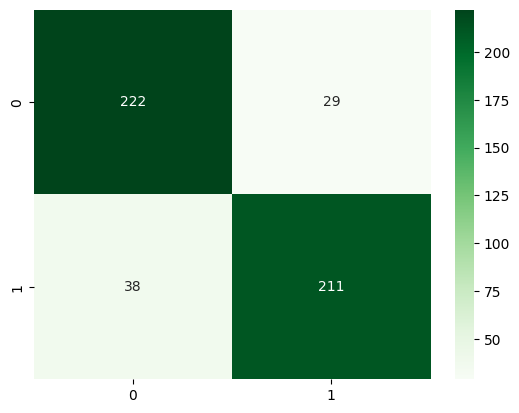

In [45]:
model_evaluation(model_svc)

In [161]:
## SVC model with scaled data has the highest testing accuracy of the group without overtraining the training dataset

In [46]:
y_pred_svc = model_svc.predict(X_test)
print(" Model Evaluation SVC : accuracy score " , accuracy_score(y_test, y_pred_svc))
print()
print(classification_report(y_test, y_pred_svc))

 Model Evaluation SVC : accuracy score  0.866

              precision    recall  f1-score   support

           0       0.85      0.88      0.87       251
           1       0.88      0.85      0.86       249

    accuracy                           0.87       500
   macro avg       0.87      0.87      0.87       500
weighted avg       0.87      0.87      0.87       500



## XGBoost Model

In [47]:
parameters = {'learning_rate': [0.03, 0.075], 
              'n_estimators': [100, 300], 
              'max_depth':[2, 5, 8],
              'gammma':[0, 0.25, 0.5],
             }
#               'reg_lambda':[0, 1, 10],
#               'scale_pos_weight':[1],
#               'subsample':[0.8, 1],
#               'colsample_bytree':[0.5, 1]
#              }

model_xgb = XGBClassifier(learning_rate=0.3, n_estimators=300, max_depth=6, verbosity = 0, tree_method='hist', device='cuda')
clf_xgb = GridSearchCV(model_xgb, parameters, n_jobs=-1, cv=skf)
print("Training ...")
clf_xgb.fit(X_train, y_train)
print("Training finished!")

Training ...
Training finished!


In [48]:
pd.DataFrame(clf_xgb.cv_results_).T

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
mean_fit_time,1.014264,1.225751,0.30045,0.672448,0.557816,1.180756,0.077903,0.208821,0.234478,0.628171,...,0.283876,0.635349,0.548511,1.137716,0.078307,0.205975,0.232063,0.576773,0.418128,0.68912
std_fit_time,0.032428,0.01584,0.03117,0.027194,0.025032,0.078306,0.006063,0.011522,0.008717,0.059953,...,0.008009,0.009706,0.017702,0.032628,0.003606,0.007998,0.008184,0.006909,0.011265,0.054099
mean_score_time,0.002773,0.00358,0.003546,0.004721,0.003564,0.006315,0.002885,0.003602,0.003458,0.004802,...,0.003219,0.004305,0.003695,0.006123,0.00297,0.003671,0.003694,0.004644,0.003709,0.00373
std_score_time,0.000364,0.00027,0.00033,0.000581,0.000495,0.00035,0.000156,0.0006,0.0001,0.000377,...,0.000644,0.000465,0.000259,0.000699,0.000358,0.000355,0.000548,0.000643,0.000472,0.000143
param_gammma,0,0,0,0,0,0,0,0,0,0,...,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5
param_learning_rate,0.03,0.03,0.03,0.03,0.03,0.03,0.075,0.075,0.075,0.075,...,0.03,0.03,0.03,0.03,0.075,0.075,0.075,0.075,0.075,0.075
param_max_depth,2,2,5,5,8,8,2,2,5,5,...,5,5,8,8,2,2,5,5,8,8
param_n_estimators,100,300,100,300,100,300,100,300,100,300,...,100,300,100,300,100,300,100,300,100,300
params,"{'gammma': 0, 'learning_rate': 0.03, 'max_dept...","{'gammma': 0, 'learning_rate': 0.03, 'max_dept...","{'gammma': 0, 'learning_rate': 0.03, 'max_dept...","{'gammma': 0, 'learning_rate': 0.03, 'max_dept...","{'gammma': 0, 'learning_rate': 0.03, 'max_dept...","{'gammma': 0, 'learning_rate': 0.03, 'max_dept...","{'gammma': 0, 'learning_rate': 0.075, 'max_dep...","{'gammma': 0, 'learning_rate': 0.075, 'max_dep...","{'gammma': 0, 'learning_rate': 0.075, 'max_dep...","{'gammma': 0, 'learning_rate': 0.075, 'max_dep...",...,"{'gammma': 0.5, 'learning_rate': 0.03, 'max_de...","{'gammma': 0.5, 'learning_rate': 0.03, 'max_de...","{'gammma': 0.5, 'learning_rate': 0.03, 'max_de...","{'gammma': 0.5, 'learning_rate': 0.03, 'max_de...","{'gammma': 0.5, 'learning_rate': 0.075, 'max_d...","{'gammma': 0.5, 'learning_rate': 0.075, 'max_d...","{'gammma': 0.5, 'learning_rate': 0.075, 'max_d...","{'gammma': 0.5, 'learning_rate': 0.075, 'max_d...","{'gammma': 0.5, 'learning_rate': 0.075, 'max_d...","{'gammma': 0.5, 'learning_rate': 0.075, 'max_d..."
split0_test_score,0.9,0.91,0.905,0.9,0.9,0.89,0.91,0.895,0.9,0.88,...,0.905,0.9,0.9,0.89,0.91,0.895,0.9,0.88,0.9,0.885


In [49]:
print(f'Best Score: {clf_xgb.best_score_}')
print(f'Best Hyperparameters: {clf_xgb.best_params_}')

Best Score: 0.8925000000000001
Best Hyperparameters: {'gammma': 0, 'learning_rate': 0.075, 'max_depth': 2, 'n_estimators': 100}


In [50]:
# model_xgb = XGBClassifier(colsample_bytree=1, gammma=0, learning_rate=0.03, max_depth=8, n_estimators=100, reg_lambda=10, scale_pos_weight=1, subsample=1, verbosity=0)
model_xgb = XGBClassifier(learning_rate=0.075, n_estimators=100, max_depth=2, verbosity=0, scale_pos_weight=1.083)
model_xgb.fit(X_train, y_train)
score = cross_val_score(model_xgb, X_train, y_train, cv=skf, scoring='accuracy')
print(f'Scores for each fold are: {score}')
print(f'Average score: {"{:.3f}".format(score.mean())}')

Scores for each fold are: [0.91  0.905 0.88  0.89  0.9   0.905 0.855 0.875 0.89  0.9  ]
Average score: 0.891


The Training Accuracy of the algorithm is  0.902
The Testing Accuracy of the algorithm is  0.872


[90.2, 87.2]

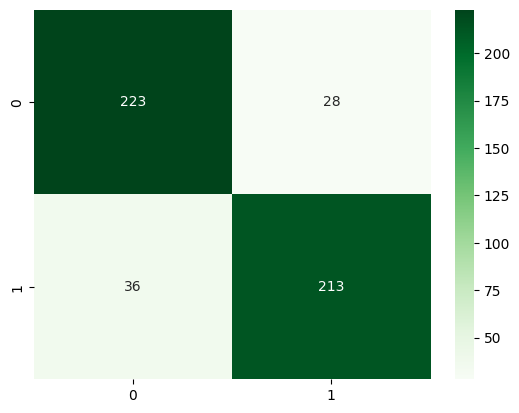

In [51]:
model_evaluation(model_xgb)

In [477]:
y_pred_xgb = model_xgb.predict(X_test)
print(" Model Evaluation XGB Classifier : accuracy score " , accuracy_score(y_test, y_pred_xgb))
print()
print(classification_report(y_test, y_pred_xgb))

 Model Evaluation XGB Classifier : accuracy score  0.9

              precision    recall  f1-score   support

           0       0.88      0.92      0.90       248
           1       0.92      0.88      0.90       252

    accuracy                           0.90       500
   macro avg       0.90      0.90      0.90       500
weighted avg       0.90      0.90      0.90       500



## Predictions Testing

In [132]:
def predict(df, model):
    y_pred = model.predict(df)
    return y_pred

In [146]:
df[2204:2205].head()

,area,perimeter,major_axis_length,minor_axis_length,convex_area,equiv_diameter,eccentricity,solidity,extent,roundness,aspect_ration,compactness,class
2204,88660,1171.153,473.4125,239.5984,89222,335.9843,0.8625,0.9937,0.7112,0.8123,1.9759,0.7097,1


In [133]:
seed2204 = {    
    'area': 88660,
    'perimeter': 1171.153,
    'major_axis_length': 473.4125,
    'minor_axis_length': 239.5984,
    'convex_area': 89222,
    'equiv_diameter': 335.9843,
    'eccentricity': 0.8625,
    'solidity': 0.9937,
    'extent': 0.7112,
    'roundness': 0.8123,
    'aspect_ration': 1.9759,
    'compactness': 0.7097,
}

In [171]:
#0
seed15 = {
    'area': 57934,
    'perimeter': 933.357,
    'major_axis_length': 368.7807,
    'minor_axis_length': 201.2084,
    'convex_area': 58651,
    'equiv_diameter': 271.595,
    'eccentricity': 0.838,
    'solidity': 0.9878,
    'extent': 0.7124,
    'roundness': 0.8357,
    'aspect_ratio': 1.8328,
    'compactness': 0.7365
}

In [139]:
# Reshape data for prediction
test = np.array(list(seed2204.values())).reshape(1, -1)

In [140]:
predict(test, model_svc)

/home/brianpraetorius/miniconda3/envs/ml-zoomcamp/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


array([1])

In [147]:
predict(test, model_xgb)

array([1])

In [161]:
print('Prediction:', model_xgb.predict(test)[0])
print('Prediction Confidence:', model_xgb.predict_proba(test)[0, model_xgb.predict(test)[0]]*100,'%')

Prediction: 1
Prediction Confidence: 71.2349534034729 %


## Trying out sklearn pipelines

In [ ]:
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import SelectKBest, f_classif

In [ ]:
pipe = make_pipeline(
    PolynomialFeatures(2),
    SelectKBest(score_func=f_classif, k=10),
    LogisticRegression()
    )
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)

In [ ]:
model_evaluation(pipe)